In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew, kurtosis
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.express as px
from scipy.signal import find_peaks
import matplotlib.cm as cm
from pprint import pprint
%run Data_manipulation.ipynb

In [2]:
NIFTY = pd.read_csv('D:/UFG/Data collection/NIFTY.csv')
NIFTY['Date']= pd.to_datetime(NIFTY['Date'], format='%Y-%m-%d')
NIFTY.head()

,Date,Close,Open,High,Low,Volume (in Billion)
0,2000-01-03,1592.2,1482.15,1592.90,1482.15,25.36
1,2000-01-04,1638.7,1594.40,1641.95,1594.40,38.79
2,2000-01-05,1595.8,1634.55,1635.50,1555.05,62.15
3,2000-01-06,1617.6,1595.80,1639.00,1595.80,51.27
4,2000-01-07,1613.3,1616.60,1628.25,1597.20,54.32


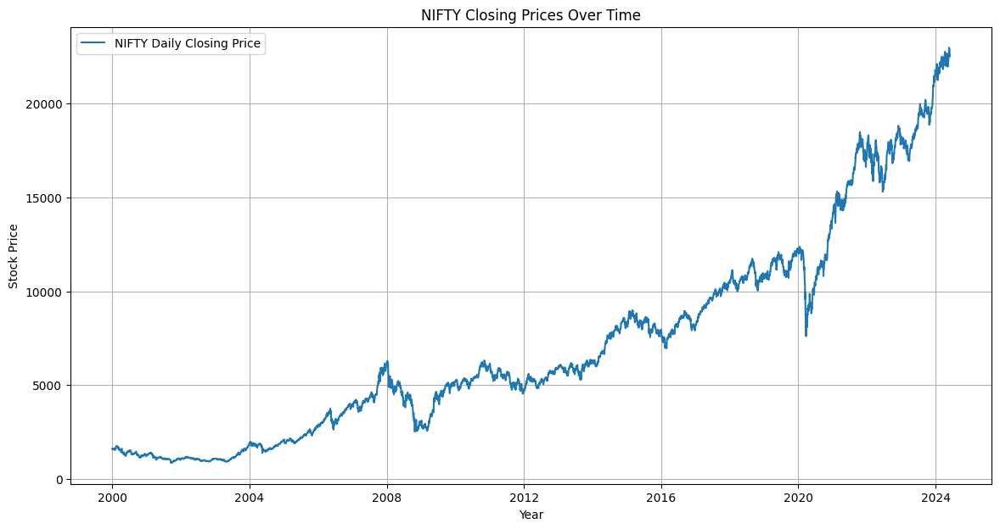

In [3]:
# NIFTY closing price
plt.figure(figsize=(14, 7))
plt.plot(NIFTY['Date'], NIFTY['Close'], label='NIFTY Daily Closing Price')
plt.title('NIFTY Closing Prices Over Time')
plt.xlabel('Year')
plt.ylabel('Stock Price')
plt.legend()
plt.grid(True)
plt.show()

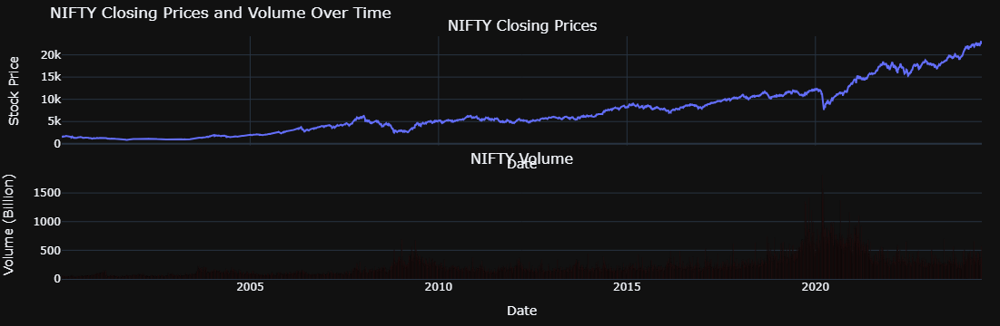

In [4]:
# Create subplots with shared x-axis
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1,
                    subplot_titles=('NIFTY Closing Prices', 'NIFTY Volume'))

# Add closing price trace
fig.add_trace(go.Scatter(x=NIFTY['Date'], y=NIFTY['Close'], mode='lines', name='NIFTY Close Price'),
              row=1, col=1)

# Add volume trace
fig.add_trace(go.Bar(x=NIFTY['Date'], y=NIFTY['Volume (in Billion)'], name='NIFTY Volume',  marker_color='red'),
              row=2, col=1)

# Customize layout
fig.update_layout(
    title='NIFTY Closing Prices and Volume Over Time',
    xaxis_title='Date',
    yaxis_title='Stock Price',
    template='plotly_dark',  # Use dark theme
    showlegend=False,
    height=700,  # Set plot height
    margin=dict(l=20, r=20, t=40, b=20),  # Adjust margins for better visibility
)

# Customize x-axis for the volume subplot
fig.update_xaxes(title_text='Date', row=2, col=1)

# Customize y-axes for the subplots
fig.update_yaxes(title_text='Stock Price', row=1, col=1)
fig.update_yaxes(title_text='Volume (Billion)', row=2, col=1)

# Show plot
fig.show()


### *When there is sudden fall in the index price, The volume of the index is increased. We can observe this instance in 2003-2004, 2008-2009 and 2019-2020*

Skewness of NIFTY Close: 0.9619779090096774
Kurtosis of NIFTY Close: 0.1337035666547144



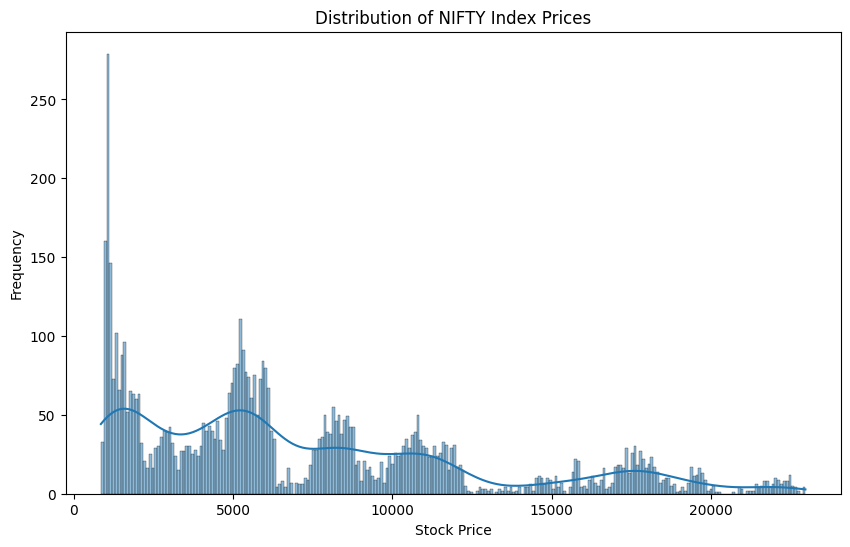

In [5]:
# Calculate the skewness and kurtosis
close_skewness = NIFTY['Close'].skew()
close_kurtosis = NIFTY['Close'].kurtosis()

print(f"Skewness of NIFTY Close: {close_skewness}")
print(f"Kurtosis of NIFTY Close: {close_kurtosis}\n")

# Plot the distribution of stock prices
plt.figure(figsize=(10, 6))
sns.histplot(NIFTY['Close'], bins=250, kde=True)
plt.title('Distribution of NIFTY Index Prices')
plt.xlabel('Stock Price')
plt.ylabel('Frequency')
plt.show()

# By year

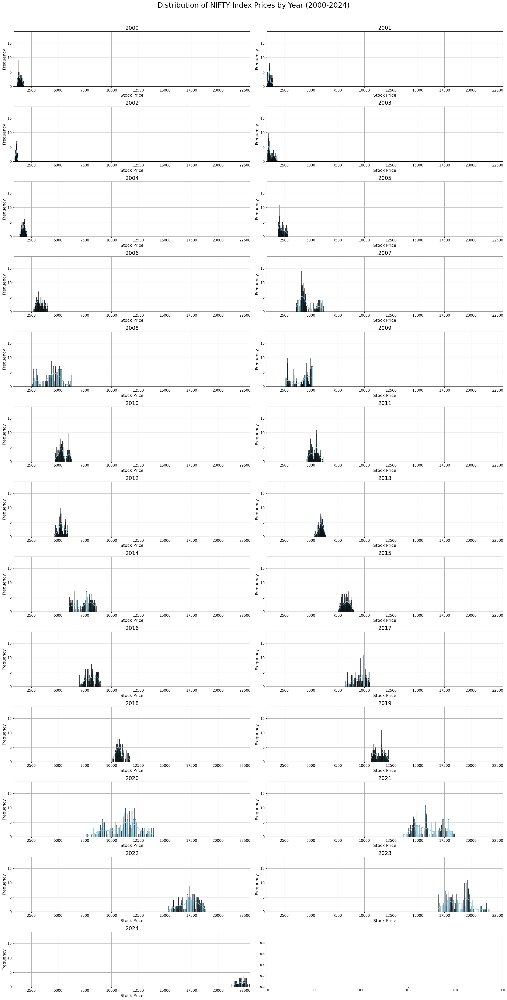

In [6]:
# Convert the 'Date' column to datetime format if it isn't already
NIFTY['Date'] = pd.to_datetime(NIFTY['Date'])

# Extract the year from the 'Date' column
NIFTY['Year'] = NIFTY['Date'].dt.year

# Set up the 13x2 grid for the subplots with larger size
fig, axes = plt.subplots(13, 2, figsize=(24, 48), sharex=False, sharey=False)
fig.suptitle('Distribution of NIFTY Index Prices by Year (2000-2024)', fontsize=24)

# Plot the distribution for each year
years = sorted(NIFTY['Year'].unique())
max_freq = 0  # Initialize a variable to store the maximum frequency
xlims = (NIFTY['Close'].min(), NIFTY['Close'].max())  # Set x-axis limits based on data range

# First loop to find the maximum frequency
for year in years:
    freq, _ = np.histogram(NIFTY[NIFTY['Year'] == year]['Close'], bins=100)
    max_freq = max(max_freq, max(freq))

# Second loop to plot the distributions with enhancements
for i, year in enumerate(years):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    sns.histplot(NIFTY[NIFTY['Year'] == year]['Close'], bins=100, kde=True, ax=ax, color='skyblue', alpha=0.7)
    ax.set_title(f'{year}', fontsize=18)
    ax.set_xlabel('Stock Price', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_ylim(0, max_freq)  # Set y-axis limit to the maximum frequency
    ax.set_xlim(xlims)  # Standardize x-axis range across all plots
    ax.grid(True)  # Add grid lines
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space at the top for the main title
plt.show()


## Volitility

In [7]:
# For Volitility

nifty_df = pd.read_csv('D:/UFG/Data collection/NIFTY.csv')
nifty_df['Date']= pd.to_datetime(nifty_df['Date'], format='%Y-%m-%d')
nifty_df.set_index('Date', inplace=True)

# Calculate daily logarithmic returns
nifty_df['LogReturn'] = np.log(nifty_df['Close'] / nifty_df['Close'].shift(1))

# Define the rolling window (e.g., 30 days)
rolling_window = 30

# Calculate rolling volatility (standard deviation of log returns)
nifty_df['Volatility'] = nifty_df['LogReturn'].rolling(window=rolling_window).std() * np.sqrt(252)  # Annualize the volatility

# Remove any NaN values that resulted from the rolling calculation
nifty_df.dropna(inplace=True)

# Create the plotly figure
fig = go.Figure()

# Add the rolling volatility trace
fig.add_trace(go.Scatter(x=nifty_df.index, y=nifty_df['Volatility'], mode='lines', name='Rolling Volatility'))

# Update the layout
fig.update_layout(
    title='NIFTY Rolling Volatility',
    xaxis_title='Date',
    yaxis_title='Volatility',
    template='plotly_dark',
    showlegend=True
)

# Show the plot
fig.show()


In [8]:
# Create the plotly figure
fig = go.Figure()

# Add the original time series
fig.add_trace(go.Scatter(x=nifty_df.index, y=nifty_df['Close'], mode='lines', name='NIFTY Close'))

# Add the rolling volatility trace
fig.add_trace(go.Scatter(x=nifty_df.index, y=nifty_df['Volatility'], mode='lines', name='Rolling Volatility', yaxis='y2'))

# Update the layout to include secondary y-axis for volatility
fig.update_layout(
    title='NIFTY Close Prices and Rolling Volatility',
    xaxis_title='Date',
    yaxis_title='NIFTY Close Prices',
    yaxis2=dict(
        title='Volatility',
        overlaying='y',
        side='right'
    ),
    template='plotly_dark',
    showlegend=True
)

# Show the plot
fig.show()

In [9]:
# Create box plot
fig = px.box(NIFTY, y='Close', title='Box Plot of NIFTY Closing Prices')

# Customize layout
fig.update_layout(
    yaxis_title='Close Price',
    template='plotly_dark',
    width=800,
    height=600
)

# Show plot
fig.show()

# For Stationary data

In [10]:
# Stationary data
scaled_data, scaler = scale_data(NIFTY)
df_residuals, df_trend, df_seasonal, decomposition_results = transform_to_stationary(scaled_data)

In [11]:
# Initialize figure with subplots
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=("Residuals", "Trend", "Seasonal"))

# Plot residuals
fig.add_trace(
    go.Scatter(x=df_residuals.index, y=df_residuals['Close'], mode='lines', name='Residuals - Close'),
    row=1, col=1
)

# Plot trend
fig.add_trace(
    go.Scatter(x=df_trend.index, y=df_trend['Close'], mode='lines', name='Trend - Close'),
    row=2, col=1
)

# Plot seasonal
fig.add_trace(
    go.Scatter(x=df_seasonal.index, y=df_seasonal['Close'], mode='lines', name='Seasonal - Close'),
    row=3, col=1
)

# Update layout
fig.update_layout(height=800,template='plotly_dark', title_text="NIFTY Time Series Decomposition - Close")

# Show plot
fig.show()

### *We can observe that the trend is bullish, and the decompostion of the different component in the time series data*

# Observing Stationary data distribution

Skewness of Stationary NIFTY Close: -0.6721440938794065
Kurtosis of Stationary NIFTY Close: 4.736178756692659

Mean of Stationary NIFTY Close: -0.0005455894541129391
Standard deviation of Stationary NIFTY Close: 0.019416381897691612



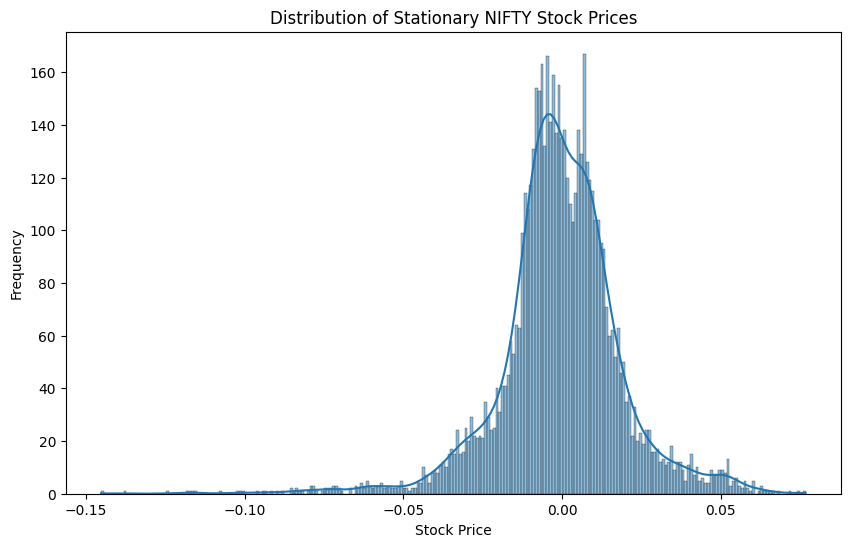

In [12]:
# Calculate the skewness and kurtosis
close_skewness = df_residuals['Close'].skew()
close_kurtosis = df_residuals['Close'].kurtosis()

print(f"Skewness of Stationary NIFTY Close: {close_skewness}")
print(f"Kurtosis of Stationary NIFTY Close: {close_kurtosis}\n")

mean = df_residuals['Close'].mean()
std = df_residuals['Close'].std()

print(f"Mean of Stationary NIFTY Close: {mean}")
print(f"Standard deviation of Stationary NIFTY Close: {std}\n")


# Plot the distribution of stock prices
plt.figure(figsize=(10, 6))
sns.histplot(df_residuals['Close'], bins=250, kde=True)
plt.title('Distribution of Stationary NIFTY Stock Prices')
plt.xlabel('Stock Price')
plt.ylabel('Frequency')
plt.show()

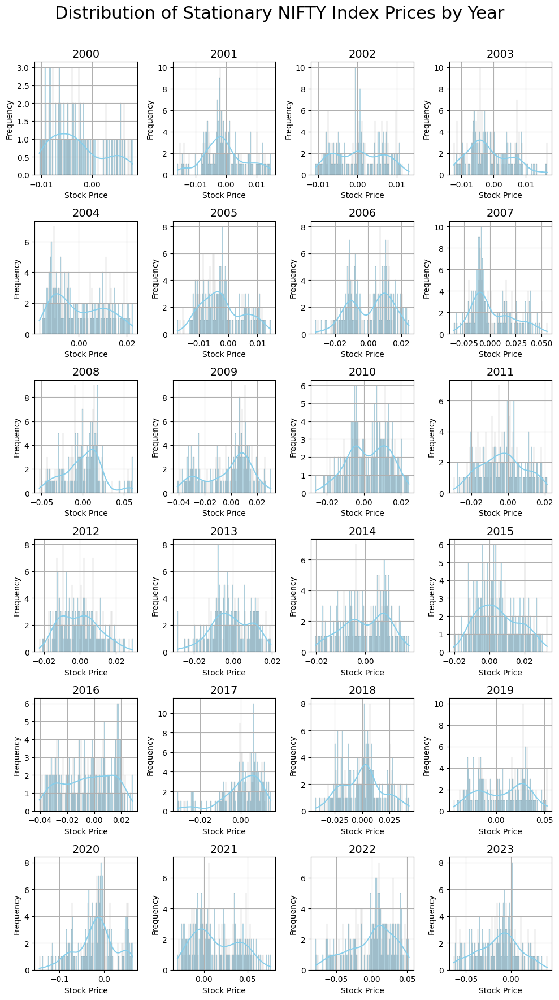

In [13]:
# Ensure that the 'Date' index is in datetime format
df_residuals.index = pd.to_datetime(df_residuals.index)

# Extract the year from the 'Date' index
df_residuals['Year'] = df_residuals.index.year

# Get the unique years
years = df_residuals['Year'].unique()

# Set up the grid for subplots with 3 columns and 8 rows
fig, axes = plt.subplots(6, 4, figsize=(10, 18), sharex=False, sharey=False)
fig.suptitle('Distribution of Stationary NIFTY Index Prices by Year', fontsize=22)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot the distribution for each year
for i, year in enumerate(years):
    sns.histplot(df_residuals[df_residuals['Year'] == year]['Close'], bins=150, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'{year}', fontsize=14)
    axes[i].set_xlabel('Stock Price', fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=10)
    axes[i].grid(True)  # Add grid lines

# Remove any empty subplots if there are less than 24 years of data
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space at the top for the main title
plt.show()

# Analysing the Trend

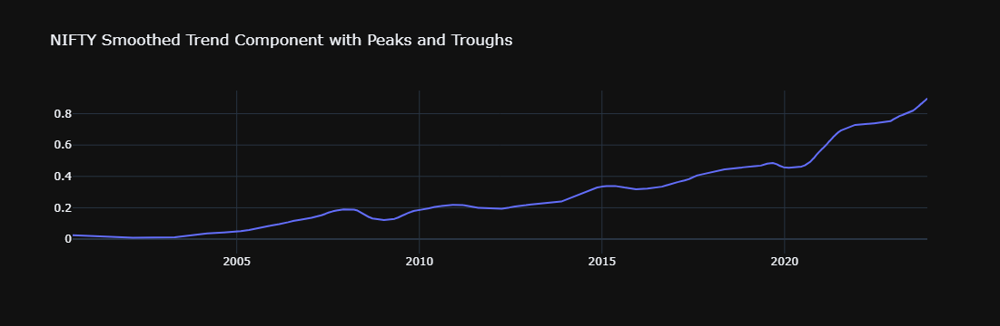

Average interval between peaks: 1209.83 days
Average interval between troughs: 1048.29 days
Average interval between troughs and closet preceding peak: 214.43 days

Intervals between successive peaks:
[2056 1127 1527 1399  205  945]

Intervals between successive troughs:
[ 265 2202 1138 1428 1168  323  814]

Interval between trough and closet preceding peak
[222, 368, 379, 280, 49, 167, 36]


In [23]:
from scipy.signal import find_peaks, savgol_filter

# Apply a smoothing filter to the trend data
df_trend['Close_smoothed'] = savgol_filter(df_trend['Close'], window_length=98, polyorder=3)

# Identify peaks and troughs on the smoothed data
trend_peaks, _ = find_peaks(df_trend['Close_smoothed'])
trend_troughs, _ = find_peaks(-df_trend['Close_smoothed'])

# Calculate intervals between peaks and troughs
peak_intervals = np.diff(df_trend.index[trend_peaks]).astype('timedelta64[D]').astype(int)
trough_intervals = np.diff(df_trend.index[trend_troughs
                        ]).astype('timedelta64[D]').astype(int)

# Calculate days for each trough and its preceding peak
days_between_peaks_and_troughs = []
for trough in trend_troughs:
    preceding_peaks = trend_peaks[trend_peaks < trough]
    if len(preceding_peaks) > 0:
        closest_preceding_peak = preceding_peaks[-1]
        days_between = (df_trend.index[trough] - df_trend.index[closest_preceding_peak]).days
        days_between_peaks_and_troughs.append(days_between)

# Create a figure with Plotly
fig = go.Figure()

# Add the smoothed trend line
fig.add_trace(go.Scatter(x=df_trend.index, y=df_trend['Close_smoothed'], mode='lines', name='Smoothed Trend - Close'))

# Add arrows for peaks
for peak in trend_peaks:
    fig.add_annotation(
        x=df_trend.index[peak],
        y=df_trend['Close_smoothed'].iloc[peak],
        ax=df_trend.index[peak],
        ay=df_trend['Close_smoothed'].iloc[peak] + (df_trend['Close_smoothed'].max() - df_trend['Close_smoothed'].min()) * 0.05,  # Adjust the arrow length
        xref="x",
        yref="y",
        axref="x",
        ayref="y",
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowcolor='red'
    )

# Add arrows for troughs
for trough in trend_troughs:
    fig.add_annotation(
        x=df_trend.index[trough],
        y=df_trend['Close_smoothed'].iloc[trough],
        ax=df_trend.index[trough],
        ay=df_trend['Close_smoothed'].iloc[trough] - (df_trend['Close_smoothed'].max() - df_trend['Close_smoothed'].min()) * 0.05,  # Adjust the arrow length
        xref="x",
        yref="y",
        axref="x",
        ayref="y",
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowcolor='green'
    )

# Update layout
fig.update_layout(height=600,template='plotly_dark', title_text="NIFTY Smoothed Trend Component with Peaks and Troughs")

# Show plot
fig.show()

# Print summary statistics
print(f'Average interval between peaks: {np.mean(peak_intervals):.2f} days')
print(f'Average interval between troughs: {np.mean(trough_intervals):.2f} days')
print(f'Average interval between troughs and closet preceding peak: {np.mean(days_between_peaks_and_troughs):.2f} days')


# Optional: Detailed intervals
print("\nIntervals between successive peaks:")
print(peak_intervals)
print("\nIntervals between successive troughs:")
print(trough_intervals)
print("\nInterval between trough and closet preceding peak")
print(days_between_peaks_and_troughs)

In [15]:
trend_peaks

array([ 460, 1876, 2637, 3674, 4621, 4759, 5401], dtype=int64)

# Observing the peaks and troughs of stationary data on original time series data

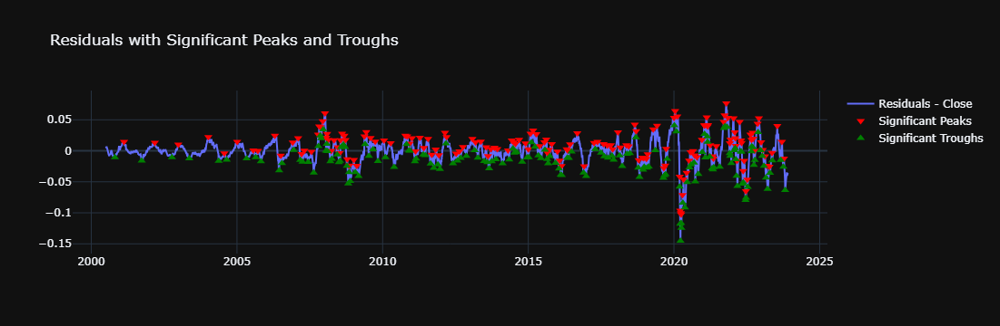

In [24]:
# Detect significant peaks and troughs in df_residuals
residual_close = df_residuals['Close'].values
residual_peaks, _ = find_peaks(residual_close, prominence=0.01)  # optimal is 0.023
residual_troughs, _ = find_peaks(-residual_close, prominence=0.01)  # Adjust the prominence value as needed

# Create a figure with Plotly
fig = go.Figure()

# Add the residual data line
fig.add_trace(go.Scatter(x=df_residuals.index, y=df_residuals['Close'], mode='lines', name='Residuals - Close'))

# Add markers for significant peaks in residuals
fig.add_trace(go.Scatter(
    x=df_residuals.index[residual_peaks],
    y=df_residuals['Close'].iloc[residual_peaks],
    mode='markers',
    marker=dict(color='red', size=8, symbol='triangle-down'),
    name='Significant Peaks'
))

# Add markers for significant troughs in residuals
fig.add_trace(go.Scatter(
    x=df_residuals.index[residual_troughs],
    y=df_residuals['Close'].iloc[residual_troughs],
    mode='markers',
    marker=dict(color='green', size=8, symbol='triangle-up'),
    name='Significant Troughs'
))

# Update layout
fig.update_layout(height=600, template='plotly_dark', title_text="Residuals with Significant Peaks and Troughs")

# Show plot
fig.show()

In [17]:
#residual_peaks

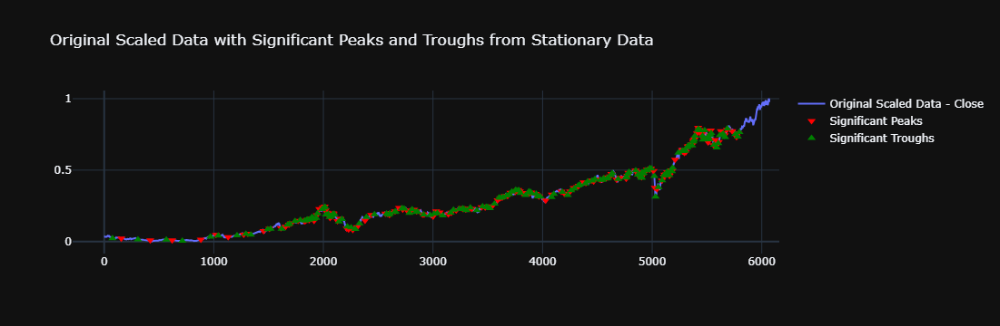

Total number of significant peaks: 171
Total number of significant troughs: 172

Significant peak indices in original scaled data:
[ 156  420  620  882 1020 1131 1273 1311 1454 1508 1612 1656 1686 1708
 1769 1827 1837 1849 1869 1887 1899 1906 1915 1941 1963 1994 2011 2020
 2033 2051 2061 2075 2089 2093 2129 2154 2213 2230 2268 2308 2380 2436
 2566 2583 2603 2622 2654 2691 2724 2762 2792 2826 2851 2904 2919 3001
 3029 3060 3140 3168 3212 3260 3275 3299 3329 3353 3444 3476 3493 3509
 3538 3590 3614 3632 3655 3681 3708 3751 3768 3778 3792 3814 3861 3880
 3896 3936 3948 3967 4028 4085 4171 4199 4252 4284 4314 4331 4375 4395
 4445 4466 4519 4531 4551 4581 4594 4616 4628 4675 4705 4763 4774 4783
 4848 4858 4878 4898 4903 4908 4910 4919 4928 4953 4976 4989 5012 5025
 5044 5089 5108 5112 5129 5137 5141 5158 5176 5184 5209 5273 5280 5294
 5308 5325 5331 5357 5368 5374 5377 5386 5409 5420 5425 5438 5446 5462
 5475 5502 5510 5519 5524 5535 5561 5573 5593 5607 5627 5640 5662 5683
 5730 5770 5786]


In [25]:

# Create a figure with Plotly
fig = go.Figure()

# Add the original scaled data line
fig.add_trace(go.Scatter(x=scaled_data.index, y=scaled_data['Close'], mode='lines', name='Original Scaled Data - Close'))

# Add markers for significant peaks in residuals on the original scaled data
fig.add_trace(go.Scatter(
    x=scaled_data.index[residual_peaks],
    y=scaled_data['Close'].iloc[residual_peaks],
    mode='markers',
    marker=dict(color='red', size=8, symbol='triangle-down'),
    name='Significant Peaks'
))

# Add markers for significant troughs in residuals on the original scaled data
fig.add_trace(go.Scatter(
    x=scaled_data.index[residual_troughs],
    y=scaled_data['Close'].iloc[residual_troughs],
    mode='markers',
    marker=dict(color='green', size=8, symbol='triangle-up'),
    name='Significant Troughs'
))

# Update layout
fig.update_layout(height=600, template='plotly_dark', title_text="Original Scaled Data with Significant Peaks and Troughs from Stationary Data")

# Show plot
fig.show()

# Print summary statistics
print(f'Total number of significant peaks: {len(residual_peaks)}')
print(f'Total number of significant troughs: {len(residual_troughs)}')

# Optional: Detailed intervals
print("\nSignificant peak indices in original scaled data:")
print(residual_peaks)
print("\nSignificant trough indices in original scaled data:")
print(residual_troughs)

In [19]:
# Combine trend peaks and troughs into one list and sort
trend_extrema = np.sort(np.concatenate([trend_peaks, trend_troughs]))

# Initialize plot
fig = go.Figure()

# Add the scaled data line
fig.add_trace(go.Scatter(x=scaled_data.index, y=scaled_data['Close'], mode='lines', name='Scaled Data'))

# Dictionary to store peaks and troughs
extrema_dict = {'Residual Peaks': {}, 'Residual Troughs': {}}

# Initialize flags
peak_index = 0
trough_index = 0

# Traverse through trend extrema
for i in range(len(scaled_data)):
    if i in trend_extrema:
        if i in trend_peaks:
            peak_index = 1
            trough_index = 0
        if i in trend_troughs:
            peak_index = 0
            trough_index = 1

    # Plot markers based on the flags
    if peak_index == 1 and trough_index == 0:
        if i in residual_peaks:
            fig.add_trace(go.Scatter(
                x=[scaled_data.index[i]],
                y=[scaled_data['Close'].iloc[i]],
                mode='markers',
                marker=dict(color='red', size=8, symbol='triangle-down'),
                name='Residual Peaks'
            ))
            # Store in dictionary
            extrema_dict['Residual Peaks'][scaled_data.index[i]] = scaled_data['Close'].iloc[i]

    if peak_index == 0 and trough_index == 1:
        if i in residual_troughs:
            fig.add_trace(go.Scatter(
                x=[scaled_data.index[i]],
                y=[scaled_data['Close'].iloc[i]],
                mode='markers',
                marker=dict(color='green', size=8, symbol='triangle-up'),
                name='Residual Troughs'
            ))
            # Store in dictionary
            extrema_dict['Residual Troughs'][scaled_data.index[i]] = scaled_data['Close'].iloc[i]


# Update layout
fig.update_layout(height=600, template='plotly_dark', title_text="Scaled Data with Trend and Residual Extrema Markers")

# Show plot
fig.show()

### *Made a strategy involving statinoary peak and troughs, also including trend peaks and troughs to get and buy and sell signal*

#### Make the extrema_dict, usable to the strategy and see the results. Also eextrema_dict contains scaled data so use NIFTY data for it for only take the days

# Strategy Explanation

# Trading Strategy Overview

*This strategy is designed to trade based on specific points identified as residual peaks (sell signals) and residual troughs (buy signals) in a time series dataset, which, in this case, is a scaled-down version of the Nifty index. The goal is to optimize the buying and selling process to maximize profits while managing risks.*

---

## Buying Strategy:

- **Buy at every green arrow (Residual Troughs)**:
  - Start by buying a fixed quantity at the first green arrow (trough).

- **Decrease the quantity after each buy**:
  - After each subsequent green arrow (trough) until the next red arrow (peak), reduce the buying quantity by 10%. This means that the quantity bought decreases with each additional green arrow to manage risk as the position increases.

- **Reset quantity after a sell**:
  - Once a sell occurs (red arrow), the buy quantity is reset to the initial quantity for the next buying cycle.

---

## Selling Strategy:

- **Sell at every red arrow (Residual Peaks)**:
  - At each red arrow, sell 1/10th (10%) of the total current holdings. This gradual selling approach ensures that the position is systematically reduced at each peak, capturing gains without exiting the position entirely at once.

---

## Portfolio and Capital Management:

- **Initial Capital**: 
  - The backtest starts with an initial capital of 100,000 units of currency.

- **Initial Quantity for Buying**:
  - The first purchase at the initial green arrow will be 100 units of the index. The quantity decreases with each subsequent green arrow as per the strategy.

- **Portfolio Value Calculation**:
  - The portfolio value is tracked daily, incorporating both the cash available and the value of the positions held.

---

## Performance Metrics:

After running the backtest, the following performance metrics are calculated:

- **Net Profit**:
  - The total profit earned after executing all the trades.

- **Return on Investment (ROI)**:
  - The percentage gain or loss relative to the initial capital.

- **Sharpe Ratio**:
  - A measure of risk-adjusted return, indicating how much excess return was generated for each unit of risk taken.

- **Maximum Drawdown**:
  - The largest peak-to-trough decline observed in the portfolio value during the backtest, representing the worst loss scenario.

- **Maximum Drawdown Percentage**:
  - The maximum drawdown as a percentage of the highest observed portfolio value.

---

## Example of Trading Execution:

- **Day 1**: 
  - First green arrow appears; buy 100 units.

- **Day 2**: 
  - Second green arrow appears; buy 90 units (10% less than the previous buy).

- **Day 3**: 
  - Third green arrow appears; buy 81 units (10% less than the previous buy).

- **Day 4**: 
  - Red arrow appears; sell 1/10th of total holdings.

- **Subsequent Days**:
  - Continue following the same pattern until all signals are exhausted.

---

## Objective:

The objective of this strategy is to optimize profit by systematically adjusting the quantity bought at each trough and gradually exiting the position at each peak. By managing both buying and selling quantities, the strategy aims to capture gains while minimizing risk exposure during volatile market movements.

---

The code provided earlier implements this strategy and calculates the performance metrics, allowing you to evaluate its effectiveness on the Nifty scaled-down time series data.


,Metric,Value
0,Initial Investment,"₹1,000,000.00"
1,Net Profit,"₹30,849,894.70"
2,ROI (%),3084.99%
3,Sharpe Ratio,0.87
4,Max Drawdown,"₹6,724,150.75"
5,Max Drawdown (%),20.71%
6,CAGR (%),15.45%


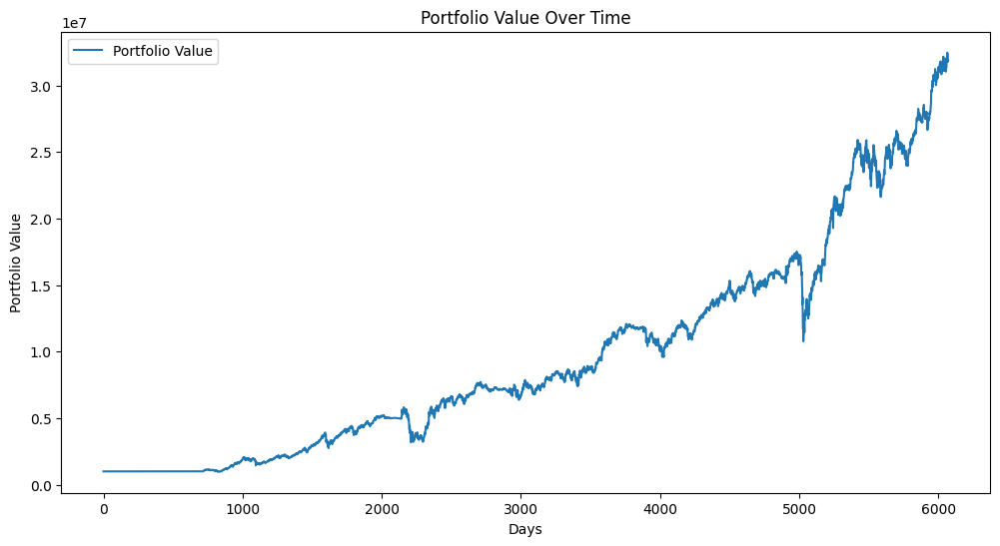

Buy on day 713 at price 956.95, Positions: 1044
Buy on day 969 at price 1579.95, Positions: 1044
Buy on day 1041 at price 1765.80, Positions: 1044
Buy on day 1212 at price 1800.10, Positions: 1044
Buy on day 1293 at price 2055.30, Positions: 1044
Buy on day 1338 at price 1916.75, Positions: 1044
Buy on day 1492 at price 2756.45, Positions: 1044
Buy on day 1518 at price 2829.10, Positions: 1044
Buy on day 1619 at price 2798.80, Positions: 1044
Buy on day 1673 at price 3430.35, Positions: 1044
Buy on day 1692 at price 3571.75, Positions: 1044
Buy on day 1741 at price 4015.95, Positions: 1044
Buy on day 1789 at price 4164.55, Positions: 1044
Buy on day 1831 at price 4083.55, Positions: 1044
Buy on day 1847 at price 4170.95, Positions: 1044
Buy on day 1855 at price 4256.55, Positions: 1044
Buy on day 1873 at price 4267.40, Positions: 1044
Sell on day 1887 at price 4387.15, Positions: 836
Sell on day 1899 at price 4445.20, Positions: 669
Sell on day 1906 at price 4356.35, Positions: 536
Sel

In [20]:
# Initialize variables
initial_capital = 1000000  # 10 lakhs
capital = initial_capital
positions = 0
cash = capital
portfolio_value = []
trades = []

# Buying-selling percentage
buying_percentage = 1
selling_percentage = 0.2

# Extract days from extrema_dict
buy_days = list(extrema_dict['Residual Troughs'].keys())
sell_days = list(extrema_dict['Residual Peaks'].keys())

# Backtesting logic
for i in range(len(NIFTY)):
    if i in buy_days:  # Buy signal at troughs
        buy_price = NIFTY['Close'].iloc[i]
        amount_to_invest = cash * buying_percentage # using avialable cash
        quantity = int(amount_to_invest / buy_price)  # Calculate quantity based on available cash
        
        if cash >= buy_price * quantity:
            positions += quantity
            cash -= buy_price * quantity
            trades.append(('Buy', NIFTY.index[i], buy_price, positions))
    
    if i in sell_days:  # Sell signal at peaks
        if positions > 0:
            sell_quantity = max(1, int(positions * selling_percentage))  # Sell 25% of holdings
            sell_price = NIFTY['Close'].iloc[i]
            positions -= sell_quantity
            cash += sell_quantity * sell_price
            trades.append(('Sell', NIFTY.index[i], sell_price, positions))
    
    # Calculate portfolio value (positions * current price + cash)
    current_value = positions * NIFTY['Close'].iloc[i] + cash
    portfolio_value.append(current_value)

# Convert portfolio_value list to a numpy array for easier calculations
portfolio_value = np.array(portfolio_value)

# Performance metrics
net_profit = portfolio_value[-1] - initial_capital
roi = (portfolio_value[-1] - initial_capital) / initial_capital * 100
returns = np.diff(portfolio_value) / portfolio_value[:-1]
sharpe_ratio = np.mean(returns) / np.std(returns) * np.sqrt(252)  # Assuming daily data
max_drawdown = np.max(np.maximum.accumulate(portfolio_value) - portfolio_value)
max_drawdown_pct = max_drawdown / np.maximum.accumulate(portfolio_value).max() * 100

# Calculate Compound Annual Growth Rate (CAGR)
days_invested = len(portfolio_value)
years_invested = days_invested / 252  # Assuming 252 trading days per year
cagr = ((portfolio_value[-1] / initial_capital) ** (1 / years_invested) - 1) * 100

# Create a dataframe to display the metrics
metrics_df = pd.DataFrame({
    'Metric': ['Initial Investment', 'Net Profit', 'ROI (%)', 'Sharpe Ratio', 'Max Drawdown', 'Max Drawdown (%)', 'CAGR (%)'],
    'Value': [f"₹{initial_capital:,.2f}", 
              f"₹{net_profit:,.2f}", 
              f"{roi:.2f}%", 
              f"{sharpe_ratio:.2f}", 
              f"₹{max_drawdown:,.2f}", 
              f"{max_drawdown_pct:.2f}%", 
              f"{cagr:.2f}%"]
})

# Display the metrics
display(metrics_df)

# Plot the portfolio value over time
plt.figure(figsize=(12, 6))
plt.plot(portfolio_value, label='Portfolio Value')
plt.title('Portfolio Value Over Time')
plt.xlabel('Days')
plt.ylabel('Portfolio Value')
plt.legend()
plt.show()

# Optional: Print the trades
for trade in trades:
    print(f"{trade[0]} on day {trade[1]} at price {trade[2]:.2f}, Positions: {trade[3]}")


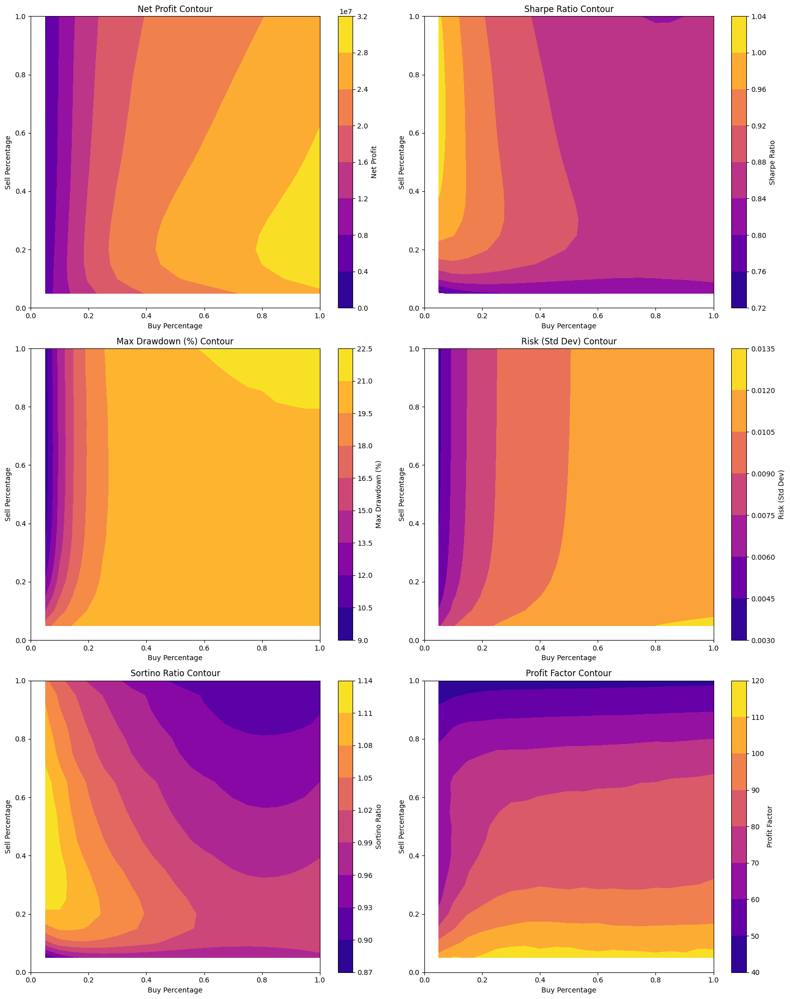

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import ParameterGrid

# Function to perform backtesting with given buy and sell percentages
def backtest_strategy(buy_pct, sell_pct):
    capital = initial_capital
    positions = 0
    cash = capital
    portfolio_value = []
    trade_count = 0
    winning_trades = 0
    losing_trades = 0
    total_profit = 0
    total_loss = 0
    
    for i in range(len(NIFTY)):
        if i in buy_days:
            buy_price = NIFTY['Close'].iloc[i]
            amount_to_invest = cash * buy_pct
            quantity = int(amount_to_invest / buy_price)
            if cash >= buy_price * quantity:
                positions += quantity
                cash -= buy_price * quantity
        
        if i in sell_days and positions > 0:
            sell_quantity = max(1, int(positions * sell_pct))
            sell_price = NIFTY['Close'].iloc[i]
            profit = sell_quantity * (sell_price - buy_price)
            total_profit += profit if profit > 0 else 0
            total_loss += -profit if profit < 0 else 0
            winning_trades += 1 if profit > 0 else 0
            losing_trades += 1 if profit < 0 else 0
            trade_count += 1
            positions -= sell_quantity
            cash += sell_quantity * sell_price
        
        current_value = positions * NIFTY['Close'].iloc[i] + cash
        portfolio_value.append(current_value)
    
    portfolio_value = np.array(portfolio_value)
    
    # Calculate performance metrics
    net_profit = portfolio_value[-1] - initial_capital
    returns = np.diff(portfolio_value) / portfolio_value[:-1]
    sharpe_ratio = np.mean(returns) / np.std(returns) * np.sqrt(252)
    
    # Sortino Ratio
    downside_returns = returns[returns < 0]
    sortino_ratio = np.mean(returns) / np.std(downside_returns) * np.sqrt(252) if len(downside_returns) > 0 else 0
    
    # Calculate drawdown
    drawdowns = np.maximum.accumulate(portfolio_value) - portfolio_value
    max_drawdown = np.max(drawdowns)
    max_drawdown_pct = max_drawdown / np.maximum.accumulate(portfolio_value).max() * 100
    
    # Calculate risk (standard deviation of returns)
    risk = np.std(returns)
    
    # Profit Factor
    profit_factor = total_profit / total_loss if total_loss != 0 else 0
    
    return net_profit, sharpe_ratio, max_drawdown_pct, risk, sortino_ratio, profit_factor

# Define the grid of buy/sell percentages to search
param_grid = {
    'buy_pct': np.linspace(0.05, 1.0, 20),  # From 5% to 100% of cash
    'sell_pct': np.linspace(0.05, 1.0, 20)  # From 5% to 100% of positions
}

# Initialize lists to store results
results = {
    'Net Profit': [],
    'Sharpe Ratio': [],
    'Max Drawdown (%)': [],
    'Risk (Std Dev)': [],
    'Sortino Ratio': [],
    'Profit Factor': [],
    'Buy Percentage': [],
    'Sell Percentage': []
}

# Perform grid search
for param in ParameterGrid(param_grid):
    buy_pct = param['buy_pct']
    sell_pct = param['sell_pct']
    results_data = backtest_strategy(buy_pct, sell_pct)
    
    for key, value in zip(results.keys(), results_data):
        results[key].append(value)
    
    results['Buy Percentage'].append(buy_pct)
    results['Sell Percentage'].append(sell_pct)

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Reshape data for contour plotting
X, Y = np.meshgrid(np.unique(results_df['Buy Percentage']), np.unique(results_df['Sell Percentage']))

Z_metrics = {metric: results_df.pivot(index='Sell Percentage', columns='Buy Percentage', values=metric).values
             for metric in results.keys() if metric not in ['Buy Percentage', 'Sell Percentage']}

# Plot contour plots for selected metrics
fig, axes = plt.subplots(3, 2, figsize=(16, 20))

cmap = 'plasma'  # Using the plasma colormap

for ax, (metric_name, Z) in zip(axes.flatten(), Z_metrics.items()):
    cp = ax.contourf(X, Y, Z, cmap=cmap)
    fig.colorbar(cp, ax=ax, label=metric_name)
    ax.set_title(f'{metric_name} Contour')
    ax.set_xlabel('Buy Percentage')
    ax.set_ylabel('Sell Percentage')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()


# Using unsupervised learning to get optimized solution

In [22]:
import numpy as np
import pandas as pd
from sklearn.model_selection import ParameterGrid
from scipy.optimize import minimize
from skopt import gp_minimize
from skopt.space import Real

# Define the weighted sum function for optimization
def objective_function(params, weights):
    buy_pct, sell_pct = params
    metrics = backtest_strategy(buy_pct, sell_pct)
    
    # Apply the weights to each metric
    weighted_sum = np.dot(metrics, weights)
    
    # Minimize the negative weighted sum to maximize it
    return -weighted_sum

# Define weights for each metric (you can adjust these)
weights = np.array([1.0, 1.0, -1.0, -1.0, 1.0, 1.0])  # Positive for metrics to maximize, negative for metrics to minimize

# Define the bounds for buy and sell percentages
bounds = [(0.05, 1.0), (0.05, 1.0)]  # Both buy and sell percentages between 5% and 100%

# Perform Bayesian Optimization
result = gp_minimize(
    func=lambda params: objective_function(params, weights),
    dimensions=bounds,
    n_calls=50,  # Number of evaluations
    random_state=42,
    acq_func='EI'  # Acquisition function
)

# Extract the optimal buy and sell percentages
optimal_buy_pct, optimal_sell_pct = result.x

# Display the optimal buy and sell percentages
print(f"Optimal Buy Percentage: {optimal_buy_pct}")
print(f"Optimal Sell Percentage: {optimal_sell_pct}")

# Evaluate the strategy using the optimal parameters
optimal_metrics = backtest_strategy(optimal_buy_pct, optimal_sell_pct)
metric_names = ['Net Profit', 'Sharpe Ratio', 'Max Drawdown (%)', 'Risk (Std Dev)', 'Sortino Ratio', 'Profit Factor']

# Display the metrics for the optimal parameters
for name, value in zip(metric_names, optimal_metrics):
    print(f"{name}: {value}")


Optimal Buy Percentage: 1.0
Optimal Sell Percentage: 0.1990439745030541
Net Profit: 30858917.200000007
Sharpe Ratio: 0.8697755727497642
Max Drawdown (%): 20.68986490326029
Risk (Std Dev): 0.011652455800701783
Sortino Ratio: 1.0140366162354433
Profit Factor: 96.65941482132621
